### Загрузка данных

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
# подключаем модуль для работы с JSON-форматом
import json
# импортируем карту и хороплет
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import numpy as np

In [2]:
mp = pd.read_csv('/datasets/moscow_places.csv')
mp.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
mp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


#### Вывод по разделу

Всего в данных представлена информация о 8406 заведениях общественного питания города Москвы. В таблице 13 столбцов. Далее рассмотрим каждый столбец в отдельности, проанализируем имеющиеся данные.

### Предобработка данных

#### Обработка дубликатов

In [4]:
mp.duplicated().sum()

0

Явных дубликатов в данных нет

Поищем возможные не явные дубликаты в некоторых столбцах

**category**

In [5]:
mp['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

**district**

In [6]:
mp['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

**rating**

In [7]:
mp['rating'].unique()

array([5. , 4.5, 4.6, 4.4, 4.7, 4.8, 4.3, 4.9, 4.2, 4.1, 4. , 3.8, 3.9,
       3.7, 3.6, 2.8, 2.7, 3.1, 1.5, 2. , 1.4, 3.3, 3.5, 3.2, 2.9, 3. ,
       3.4, 2.3, 2.2, 2.5, 2.6, 1.7, 1. , 1.1, 2.4, 1.3, 1.2, 2.1, 1.8,
       1.9, 1.6])

**price**

In [8]:
mp['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

**chain**

In [9]:
mp['chain'].unique()

array([0, 1])

**name**

In [10]:
unik = mp.groupby(['name', 'address']).count().reset_index()

In [11]:
unik = unik.query('category>1')
unik

,name,address,category,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Дубликаты в данных не обнаружены

#### Удаление пропусков

Выведем количество пропущенных значений для каждого столбца.

In [12]:
mp.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Определим долю пропусков

In [13]:
pd.DataFrame(round(mp.isna().mean().sort_values(ascending=False)*100,1))\
.style.background_gradient('coolwarm')

,0
middle_coffee_cup,93.600000
middle_avg_bill,62.500000
price,60.600000
avg_bill,54.600000
seats,43.000000
hours,6.400000
name,0.000000
category,0.000000
address,0.000000
district,0.000000


Рассмотрим подробнее все столбцы, содержащие пропуски

In [14]:
mp.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


**hours**

Столбец содержит информацию о времени работы заведений. Информация в столбце может быть крайне важна, для реальной оценки местности, например если кафе конкурент открывается только с 10, имеет смысл открываться пораньше, чтобы охватить аудиторию людей предпочитающих завтрак до работы. В реальной жизнь столбец стоило бы обогатить недостающими данными, в рамках нашего исследования данные пропущены для 6.3% заведений, терять заведения совсем рисковано, заменим пропуски в этом столбце на 'unknown'

In [15]:
mp['hours'] = mp['hours'].fillna('unknown')

**price**

Явную зависимость, которая однозначно могла бы указать нам на значения для столбца установить трудно. заменим пропуски в этом столбце на 'unknown'

In [16]:
mp['price'] = mp['price'].fillna('unknown')

**avg_bill**

Среднюю стоимость заказа также не установить, заменяем на 'unknown'

In [17]:
mp['avg_bill'] = mp['avg_bill'].fillna('unknown')

Для столбцов **middle_avg_bill** и **middle_coffee_cup** пропуски оставим как есть, несмотря на их большое количество. Замена на среднее или медианное значение тут не подойдет, даже если учесть категорию заведения, данные могут быть сильно искажены.

**seats**

Столбец содержит данные о количестве посадочных мест, вижу 3 варианта: оставить как есть, заменить заглушкой -1, рассчитать медианное значение для каждой категории и заполнить этими значениями. Пока остановимся на 1 варианте, оставляем пропуски как есть.

In [18]:
mp.isna().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                   0
avg_bill                0
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

#### Создание новых столбцов

**street**

Создадим столбец street с названиями улиц из столбца с адресом

In [19]:
mp.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,unknown,unknown,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Распарсим строки в столбце address методом split(), в новый столбце добавим индекс 1, идущий после города и обозначающий улицу

In [20]:
mp['street'] = mp['address'].str.split(',', expand=True)[1]

Удалим возможные пробелы в начале и конце строки

In [21]:
mp['street'] = mp['street'].str.strip()

In [22]:
mp.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,unknown,unknown,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


**is_24/7**

Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

- логическое значение True — если заведение работает ежедневно и круглосуточно


- логическое значение False — в противоположном случае

Для решения задачи создадим функцию, который будет проходить по строкам столбца hours, в случае если в столбце будут одновременно слова ежедневно и круглосуточно, записывать True,  иначе False

In [23]:
def is_every_day(res):
    return 'ежедневно' in res and 'круглосуточно' in res


In [24]:
mp['is_24/7'] = mp['hours'].apply(is_every_day)

In [25]:
mp.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,unknown,unknown,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


#### Вывод по разделу

В ходе предобработки нами была проведена проверка на дубликаты в данных, явные и не явные, дублирующих записей не обнаружено. 

Выявлены столбцы содержащие пропуски, принято решение данные не удалять, а заменить на пропущенные значения на 'unknown'

Для дальнейшей исследовательской работы, были созданы 2 новых столбца: street(содержит назввание улицы) и is_24/7(содержит булевые  значения в зависимости от времени работы заведения)

### Анализ данных

#### Категории заведений

Сгруппируем данные по категориям и отобразим для наглядности в виде столбчатой диаграммы

In [26]:
mp_category = mp.pivot_table (index='category', values='name', aggfunc='count').reset_index() \
.sort_values(by='name')
mp_category

,category,name
1,булочная,256
7,столовая,315
2,быстрое питание,603
5,пиццерия,633
0,"бар,паб",765
4,кофейня,1413
6,ресторан,2043
3,кафе,2378


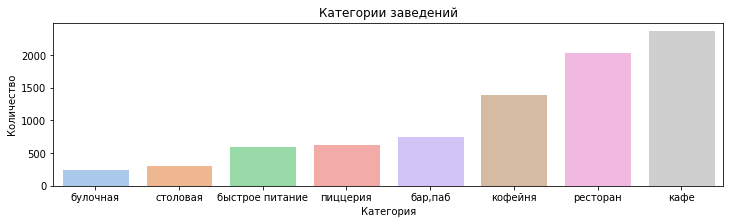

In [27]:
plt.figure(figsize=(12, 3))
plt.title("Категории заведений")
sns.set_style('dark')
sns.set_palette('pastel') 
sns.barplot(x='category', y='name', data=mp_category)
plt.xlabel("Категория")
plt.ylabel("Количество")
plt.show()

Если принять за истину, что в датасете собраны все заведения общественного питания города, можно сделать вывод что большинство заведений попадает в категорию Кафе и Ресторан, Кофейни занимают только 3 место, а кажется что они на каждом шагу!

#### Количество посадочных мест

Подготовим данные для визуализации, рассчитаем медианное значение количества посадочных мест для каждой категории заведений

In [28]:
mp_seats = mp.pivot_table(index='category', values='seats', aggfunc='median').reset_index().\
sort_values(by='seats')
mp_seats

,category,seats
1,булочная,50.0
5,пиццерия,55.0
3,кафе,60.0
2,быстрое питание,65.0
7,столовая,75.5
4,кофейня,80.0
0,"бар,паб",82.5
6,ресторан,86.0


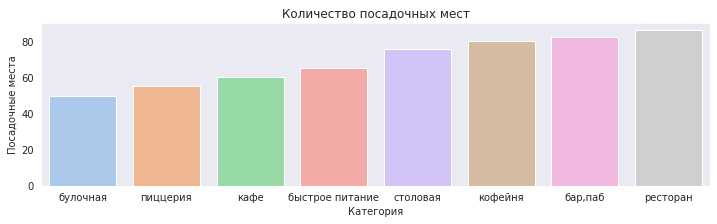

In [29]:
plt.figure(figsize=(12, 3))
plt.title("Количество посадочных мест")
sns.set_style('dark')
sns.set_palette('pastel') 
sns.barplot(x='category', y='seats', data=mp_seats)
plt.xlabel("Категория")
plt.ylabel("Посадочные места")
plt.show()

Меньше всего посадочных мест в булочной и пиццерии, можно предположить что работа этих заведений рассчитана на доставку либо на самовывоз. Больше мест в ресторанах, барах и кофейнях. Взяв медианные значения, мы исключили влияние возможных аномалий в значениях. 

#### Cоотношение сетевых и несетевых заведений

In [30]:
mp_chain = mp.pivot_table(index=['category','chain'], values='name', aggfunc='count').reset_index()
mp_chain

,category,chain,name
0,"бар,паб",0,596
1,"бар,паб",1,169
2,булочная,0,99
3,булочная,1,157
4,быстрое питание,0,371
5,быстрое питание,1,232
6,кафе,0,1599
7,кафе,1,779
8,кофейня,0,693
9,кофейня,1,720


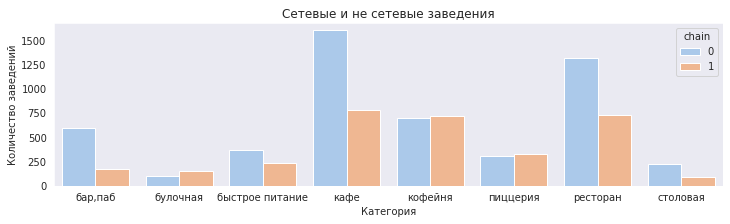

In [31]:
plt.figure(figsize=(12, 3))
sns.barplot(x='category', y='name', hue='chain', data=mp_chain)
plt.title("Сетевые и не сетевые заведения")
sns.set_style('dark')
sns.set_palette('pastel') 
plt.xlabel("Категория")
plt.ylabel("Количество заведений")
plt.show()

Напомним, 0 - заведение не сетевое, 1 - сетевое

Посмотрим общее количество сетевых и не сетевых заведений

In [32]:
mp_chain_total = mp.pivot_table(index='chain', values='name', aggfunc='count').reset_index()
mp_chain_total

,chain,name
0,0,5201
1,1,3205


Определено, что не сетевых заведений больше, чем сетевых. Но в некоткорых категориях, эта пропорция обратная: булочные, кофейни и пиццерии имеют больше сетевых заведений чем локальных.

#### Топ-15 популярных сетей в Москве

In [33]:
mp_name = mp.pivot_table(index=['name','category'], values='rating', aggfunc='count')\
.reset_index().sort_values(by='rating', ascending=False)
mp_name.head(15)

,name,category,rating
3087,Кафе,кафе,159
5943,Шоколадница,кофейня,119
2750,Домино'с Пицца,пиццерия,76
2714,Додо Пицца,пиццерия,74
1214,One Price Coffee,кофейня,71
6019,Яндекс Лавка,ресторан,69
433,Cofix,кофейня,65
1362,Prime,ресторан,49
3011,КОФЕПОРТ,кофейня,42
3529,Кулинарная лавка братьев Караваевых,кафе,39


Уберем из таблицы заведения с не явным наименованием: кафе, шаурма, хинкальная, ресторан, столовая

In [34]:
mp_name = mp_name.query("name not in ['Кафе','Шаурма','Хинкальная', 'Ресторан', 'Столовая']")
mp_name = mp_name.head(15)
mp_name

,name,category,rating
5943,Шоколадница,кофейня,119
2750,Домино'с Пицца,пиццерия,76
2714,Додо Пицца,пиццерия,74
1214,One Price Coffee,кофейня,71
6019,Яндекс Лавка,ресторан,69
433,Cofix,кофейня,65
1362,Prime,ресторан,49
3011,КОФЕПОРТ,кофейня,42
3529,Кулинарная лавка братьев Караваевых,кафе,39
5141,Теремок,ресторан,36


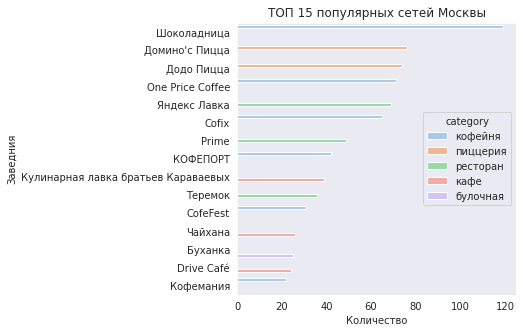

In [35]:
plt.figure(figsize=(5, 5))
plt.title("ТОП 15 популярных сетей Москвы")
sns.set_style('dark')
sns.set_palette('pastel') 
ax = sns.barplot(x='rating', y='name', hue='category', data=mp_name)
plt.xlabel("Количество")
plt.ylabel("Заведния")
plt.show()

Как видно из списка, самые популярные сети в Москве относятся к категориям: кофейни и пиццерии

#### Административные районы Москвы

In [36]:
mp_district = mp.pivot_table(index=['category','district'], values='name', aggfunc='count').reset_index()
mp_district.head()

,category,district,name
0,"бар,паб",Восточный административный округ,53
1,"бар,паб",Западный административный округ,50
2,"бар,паб",Северный административный округ,68
3,"бар,паб",Северо-Восточный административный округ,63
4,"бар,паб",Северо-Западный административный округ,23


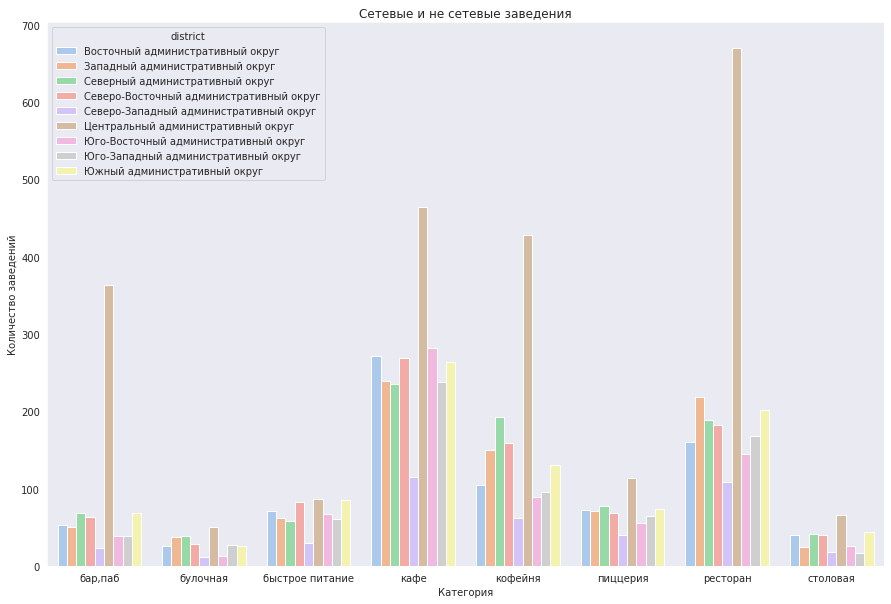

In [37]:
plt.figure(figsize=(15, 10))
sns.barplot(x='category', y='name', hue='district', data=mp_district)
plt.title("Сетевые и не сетевые заведения")
sns.set_style('dark')
sns.set_palette('pastel') 
plt.xlabel("Категория")
plt.ylabel("Количество заведений")
plt.show()

Построим еще круговую диаграмму, которая покажет распределение районов от общего их числа

In [38]:
mp_distr_pie = mp.groupby('district').agg({'name': 'count'}).reset_index().rename(columns={'name':'count_rest'})
mp_distr_pie

,district,count_rest
0,Восточный административный округ,798
1,Западный административный округ,851
2,Северный административный округ,900
3,Северо-Восточный административный округ,891
4,Северо-Западный административный округ,409
5,Центральный административный округ,2242
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Южный административный округ,892


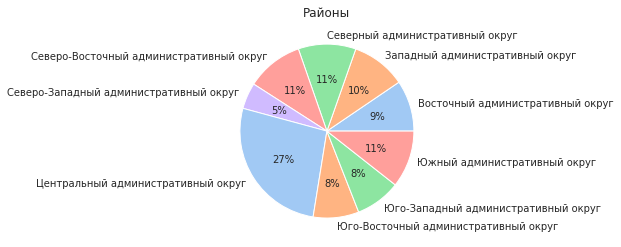

In [39]:
colors = sns.color_palette('pastel')[ 0:5 ]
labels = mp_distr_pie['district']
plt.title("Районы")
plt.pie(mp_distr_pie['count_rest'],labels = labels, colors = colors, autopct='%.0f%%')
plt.show()

По графиками мы определили, что большая доля заведений расположена в центральном административном округе (27%), при этом центральный район доминирует не во всех категория, например булочные и кафе быстрого питания распределены равномерно по районам, рестораны и бары напротив открывают в центре.

#### Средний рейтинг

In [40]:
mp_rating = mp.pivot_table(index='category', values='rating', aggfunc='mean').reset_index()\
.rename(columns={'rating':'avg_rating'})
mp_rating

,category,avg_rating
0,"бар,паб",4.387712
1,булочная,4.268359
2,быстрое питание,4.050249
3,кафе,4.123886
4,кофейня,4.277282
5,пиццерия,4.301264
6,ресторан,4.290357
7,столовая,4.211429


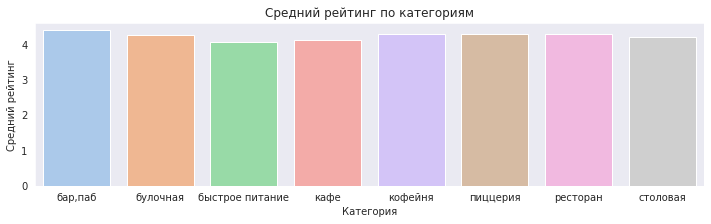

In [41]:
plt.figure(figsize=(12, 3))
plt.title("Средний рейтинг по категориям")
sns.set_style('dark')
sns.set_palette('pastel') 
sns.barplot(x='category', y='avg_rating', data=mp_rating)
plt.xlabel("Категория")
plt.ylabel("Средний рейтинг")
plt.show()

Как видно из графика, средний рейтинг взятый по всей категории является мало показательным, и для всех заведений составляет около 4. При этом даже на такой визуализации можно обратить внимание, что рейтинг столовых и кафе быстрого питания несколько ниже остальных категорий

#### Фоновая картограмма среднего рейтинга

Подготовим таблицу с среднийм рейтингом по районам

In [42]:
mp_distr_horo = mp.pivot_table(index='district', values='rating', aggfunc='mean').reset_index()
mp_distr_horo

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [43]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

In [44]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

In [45]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

In [46]:
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=mp_distr_horo,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

По картограмме информации уже больше, выявлены районы Москвы с большим рейтингом заведений, центральный, северный и северо-западный. Высокий рейтинг в центре легко обьяснить большой концентрацией ресторанов, с хорошим обсуживанием и кухней. Ниже всего рейтинги в заведениях на юго-востоке, из открытых источников известно, что этот район имеет меньшую стоимость жилья, болшую концентрацию людей и ниже уровень инфраструктуры.

#### Кластеры расположения заведений

In [47]:
# создаём пустой кластер, добавляем его на ранее созданную карту
marker_cluster = MarkerCluster().add_to(m)

In [48]:
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

In [49]:
# применяем функцию create_clusters() к каждой строке датафрейма
mp.apply(create_clusters, axis=1)

# выводим карту
m

#### Топ-15 улиц по количеству заведений

In [50]:
mp_street = mp.pivot_table(index=['street'], values='rating', aggfunc='count')\
.reset_index().sort_values(by='rating', ascending=False).rename(columns={'rating':'count_rest'})
mp_street_15=mp_street.head(15)
mp_street_15

,street,count_rest
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


ТОП 15 улиц по количеству заведений определен. Теперь добавим к этому списку информацию по категориям, обьединив с таблицей mp

In [51]:
mp_merge = mp_street_15.merge(mp, on='street')
mp_merge.head()

,street,count_rest,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7
0,проспект Мира,184,Все Лень,ресторан,"Москва, проспект Мира, 119, стр. 528",Северо-Восточный административный округ,"пн-чт 12:00–21:00; пт,сб 12:00–22:00; вс 12:00...",55.836107,37.614875,4.4,выше среднего,Средний счёт:от 1500 ₽,1500.0,NaN,0,NaN,False
1,проспект Мира,184,Старое место,кафе,"Москва, проспект Мира, 119, стр. 504",Северо-Восточный административный округ,"ежедневно, 11:00–22:00",55.837212,37.616469,4.1,средние,Средний счёт:900–1100 ₽,1000.0,NaN,0,NaN,False
2,проспект Мира,184,Doner One,кафе,"Москва, проспект Мира, 119, стр. 596",Северо-Восточный административный округ,"ежедневно, 11:00–21:00",55.839037,37.613027,4.2,unknown,unknown,NaN,NaN,0,NaN,False
3,проспект Мира,184,Пян-се,быстрое питание,"Москва, проспект Мира, 119, стр. 27",Северо-Восточный административный округ,"ежедневно, 10:00–20:00",55.834563,37.613549,4.4,unknown,unknown,NaN,NaN,1,NaN,False
4,проспект Мира,184,Космос,кафе,"Москва, проспект Мира, 119, стр. 34",Северо-Восточный административный округ,вт-вс 10:45–21:00,55.835060,37.622033,3.8,unknown,unknown,NaN,NaN,0,NaN,False


In [52]:
mp_merge_street = mp_merge.pivot_table(index=['street','category'], values='name', aggfunc='count').\
reset_index().rename(columns={'name':'count_rest'})
mp_merge_street.head()

,street,category,count_rest
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,18
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4


Данне подготовлены, строим визуализацию

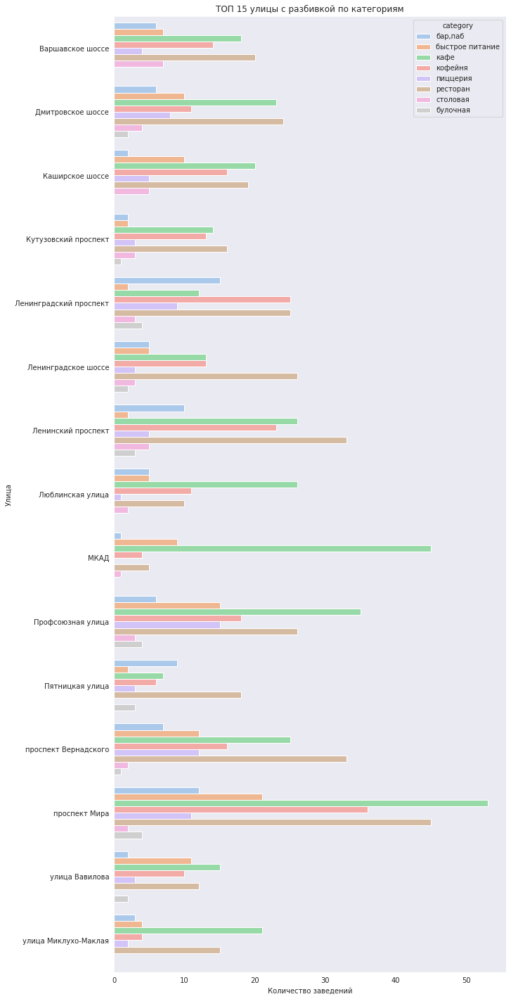

In [53]:
plt.figure(figsize=(10, 25))
sns.barplot(x='count_rest', y='street', hue='category', data=mp_merge_street)
plt.title("ТОП 15 улицы с разбивкой по категориям")
sns.set_style('dark')
sns.set_palette('pastel') 
plt.xlabel("Количество заведений")
plt.ylabel("Улица")
plt.show()

По графику распределения заведений на 15 самых популярных улицах, можно сделать заметить, что например на МКАД практически нет ресторанов, основную долю заведений тут составляет Кафе. Самые насыщенные Ресторанами улицы, это: Проспект Мира, Проспект Вернадского и Ленинский. Больше всего кофеен на Проспекте Мира и Ленинградском проспекте. Тут также отметим, что наверняка концентрация заведений на квадратный метр в центре выше, но в топ попали большие и протяженные проспекты, длина которых намного выше центральных улиц, и суммарное количество заведений также больше

В дополнение, используя данные из таблицы mp_street, найдем улицы на которых расположено только 1 заведение общепита

In [54]:
mp_street = mp_street.query('count_rest==1')
mp_street.count()

street        458
count_rest    458
dtype: int64

In [55]:
mp_street.head(3)

,street,count_rest
1421,улица Фотиевой,1
1418,улица Фадеева,1
1233,улица Кирпичные Выемки,1


Всего в датасете обнаружено 458 улицы, на которых раположено только 1 заведение общепита, посмотрим полную информацию по этим заведениям, обьединив с таблицей mp

In [56]:
mp_street_min = mp_street.merge(mp, on='street')
mp_street_min.head(3)

,street,count_rest,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7
0,улица Фотиевой,1,Кафе,столовая,"Москва, улица Фотиевой, 10",Юго-Западный административный округ,пн-пт 08:00–17:00,55.701889,37.561508,4.1,unknown,Средний счёт:300–400 ₽,350.0,NaN,0,NaN,False
1,улица Фадеева,1,Просвет,кофейня,"Москва, улица Фадеева, 10",Центральный административный округ,"ежедневно, 08:00–23:00",55.775799,37.596735,4.6,unknown,Цена чашки капучино:200–300 ₽,NaN,250.0,0,NaN,False
2,улица Кирпичные Выемки,1,Чайная,кафе,"Москва, улица Кирпичные Выемки, 2, корп. 1",Южный административный округ,пн-пт 09:00–18:00,55.586983,37.601222,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,1,21.0,False


Посмотрим на расположение этих заведений, отобразив на карте в виде кластеров

In [57]:
# создаём карту Москвы
mq = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

In [58]:
# создаём пустой кластер, добавляем его на ранее созданную карту
marker_cluster = MarkerCluster().add_to(mq)

In [59]:
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

In [60]:
mp_street_min.apply(create_clusters, axis=1)
mq

По расположению улиц на которых только 1 заведение общественного питания, можно предположить:

- есть улицы с низкой проходимостью, расположенные далеко от центра и жилых районов

- некоторые улицы расположены в самом центре и имеют достаточную протяженность, возможно ошибка в данных. Заведений должно быть больше

#### Средний чек по районам

Подготовим данные для визуализации. Рассчитаем средний чек заведения по районам. В качестве среднего чека возьмем мединные значения столбца middle_avg_bill

In [61]:
mp_avg_bill = mp.pivot_table(index='district', values='middle_avg_bill', aggfunc='median').reset_index()
mp_avg_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


Посмотрим картограмму

In [62]:
# создаём карту Москвы
m_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

In [63]:
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=mp_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m_bill)

# выводим карту
m_bill

Данные визуализации, говорят нам о том что средний чек в центре Москвы ожидаемо имеет высокие значения в районе 1000р, при этом заведения Западного административного округа также можно отнести к дорогим, значения среднего чека сопоставимо с заведениям Центрального округа. Ранее мы исследовали ретинг заведений, и обращали внимание что на севере и северо западе рейтинг выше чем в других районах вокруг центра, исходя из новых данных можно сделать вывод что высокий чек ( на западе) не является гарантом высокого рейтинга (в западном районе он сопостовим с другими районами вокруг центра, и ниже чем например на севере)

#### Вывод по разделу

Проведя разносторонний анализ данных, можно отметить следующие наблюдения:

- Если принять за истину, что в датасете собраны все заведения общественного питания города, можно сделать вывод что большинство заведений попадает в категорию Кафе и Ресторан, Кофейни занимают только 3 место, а кажется что они на каждом шагу!


- Меньше всего посадочных мест в булочной и пиццерии, можно предположить что работа этих заведений рассчитана на доставку либо на самовывоз. Больше мест в ресторанах, барах и кофейнях.


- Как видно из списка, самые популярные сети в Москве относятся к категориям: кофейни, пиццерии, быстрое питание. 


- Определено, что не сетевых заведений больше, чем сетевых. Но в некоткорых категориях, эта пропорция обратная: булочные, кофейни и пиццерии имеют больше сетевых заведений чем локальных.


- По графиками мы определили, что большая доля заведений расположена в центральном административном округе (27%), при этом центральный район доминирует не во всех категория, например булочные и кафе быстрого питания распределены равномерно по районам, рестораны и бары напротив открывают в центре.


- Можно обратить внимание, что рейтинг столовых и кафе быстрого питания несколько ниже остальных категорий. Выявлены районы Москвы с большим рейтингом заведений, центральный, северный и северо-западный. Высокий рейтинг в центре легко обьяснить большой концентрацией ресторанов, с хорошим обсуживанием и кухней. Ниже всего рейтинги в заведениях на юго-востоке, из открытых источников известно, что этот район имеет меньшую стоимость жилья, болшую концентрацию людей и ниже уровень инфраструктуры.


- Определены 15 самых популярных по количеству заведений улиц Москвы, можно сделать заметить, что например на МКАД практически нет ресторанов, основную долю заведений тут составляет Кафе. Самые насыщенные Ресторанами улицы, это: Проспект Мира, Проспект Вернадского и Ленинский. Больше всего кофеен на Проспекте Мира и Ленинградском проспекте. Тут также отметим, что наверняка концентрация заведений на квадратный метр в центре выше, но в топ попали большие и протяженные проспекты, длина которых намного выше центральных улиц, и суммарное количество заведений также больше


- Средний чек в центре Москвы ожидаемо имеет высокие значения в районе 1000р, при этом заведения Западного административного округа также можно отнести к дорогим, значения среднего чека сопоставимо с заведениям Центрального округа. Ранее мы исследовали ретинг заведений, и обращали внимание что на севере и северо западе рейтинг выше чем в других районах вокруг центра, исходя из новых данных можно сделать вывод что высокий чек ( на западе) не является гарантом высокого рейтинга (в западном районе он сопостовим с другими районами вокруг центра, и ниже чем например на севере)

### Исследование: открытие кофейни

#### Особенности расположения

Попробуем определить оптимальный район, расположение и формат кофейни, дать рекомендации инвесторам. Напомним, заказчики хотят чтобы заведение было доступным и популярным.

Подготовим данные для исследования, собрав датасет из заведений с типом Кофейня

In [64]:
mp_coffee = mp.query('category == "кофейня"')
mp_coffee['name'].count()

1413

Получилась таблица mp_coffee с информацией по 1413 кофейням Москвы. Посмотрим распределение кофеен по районам, построим визуализацию

In [65]:
mp_coffee_district = mp_coffee.pivot_table(index='district', values='name', aggfunc='count')\
.reset_index().rename(columns={'name':'count'})
mp_coffee_district

,district,count
0,Восточный административный округ,105
1,Западный административный округ,150
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
4,Северо-Западный административный округ,62
5,Центральный административный округ,428
6,Юго-Восточный административный округ,89
7,Юго-Западный административный округ,96
8,Южный административный округ,131


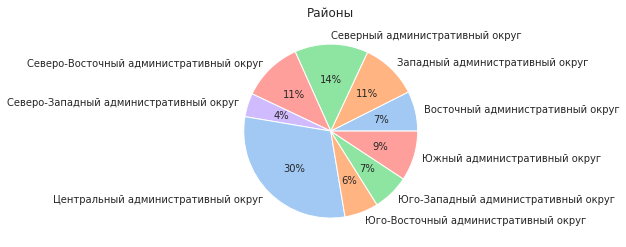

In [66]:
colors = sns.color_palette('pastel')[ 0:5 ]
sns.set_style('darkgrid')
labels = mp_coffee_district['district']
plt.title("Районы")
plt.pie(mp_coffee_district['count'],labels = labels, colors = colors, autopct='%.0f%%')
plt.show()

30% всех коффен расположены в Центральном административном округе, ожидаемо, так как в этом районе сосредоточена большая часть рабочих мест и высокая проходимость. Выделим также Северный административный округ, с долей в 14%

Отразим кофейни на карте, чтобы рассмотреть особенности их расположения внутри округов

In [67]:
# создаём карту Москвы
m_coffee = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

In [68]:
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

In [69]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_coffee)

In [70]:
# применяем функцию create_clusters() к каждой строке датафрейма
mp_coffee.apply(create_clusters, axis=1)
# выводим карту
m_coffee

По карте можно обратить внимание, что приемущественно кофейни расположны недалеко от станций Московского метрополитена, вблизи парков и торговых центров. 

#### Режим работы

Определим, есть ли кофейни с круглосуточным режимом работы

In [71]:
mp_coffee['is_24/7'].sum()

59

Круглосуточных кофеен обнаружено не много (4% от общего числа), значит в этой сфере присутсвует определенная "сезонность", под "сезонностью" в данном случае понимаем пик спроса в течении дня. Учитывая что кофе напиток приемущественно утренний, ночью на него спрос минимальный, поэтому мало и предложений.

In [72]:
# Код ревьюера

mp_coffee['is_24/7'].sum()

59

#### Рейтинги

Рассмотрим рейтинги кофеен с распределением по районам

Подготовим данные, определив средний рейтинг коффен по районам

In [73]:
mp_coffee_rating = mp_coffee.pivot_table(index='district', values='rating', aggfunc='mean')\
.reset_index().rename(columns={'rating':'mean_rating'}).sort_values(by='mean_rating', ascending=False)
mp_coffee_rating

,district,mean_rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


In [74]:
# создаём карту Москвы
m_coffee_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

In [75]:
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=mp_coffee_rating,
    columns=['district', 'mean_rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m_coffee_rating)

# выводим карту
m_coffee_rating

Наивысший рейтинг имеют кофейни расположенные в центральном и северо-западном районе, интересное наблюдение, самый низкий рейтинг имеют кофейни Западного округа, как мы помним этот район выделяется по среднему чеку всех заведений, ниже рассмотрим средний чек кофеен этого района

#### Средний чек

Рассчитаем средний чек коффен по районам. В качестве среднего чека возьмем медианные значения столбца middle_coffee_cup

In [76]:
mp_coffee_avg_bill = mp_coffee.pivot_table(index='district', values='middle_coffee_cup', aggfunc='median')\
.reset_index().sort_values(by='middle_coffee_cup', ascending=False)
mp_coffee_avg_bill

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [77]:
# создаём карту Москвы
m_coffee_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

In [78]:
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=mp_coffee_avg_bill,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m_coffee_bill)

# выводим карту
m_coffee_bill

Рассматривая среднюю стоимость чашки кофе по районам, выделяем Западный административный округ, в этом районе высокая стоимость чашки (189р) при этом рейтинги кофеен в этом районе низкие по сравнению с другими. Возможно это и не нравится посетителям, оплачивая более высокую цену, клиенты ожидают чего то необычного. Стоит рассмотреть этот район для открытия кофейни, сделать ее доступной, уставновив цену чашки кофе в районе 170р, это привлечет внимание клиентов и не будет завышенных ожиданий. Рассматривать недвижимость для будущей кофейни стоит в близи станций новой желтой ветки  метро (Боровсков ш), районы Солнцево, Говорово, Новопеределкино, Рассказовка, в нашем датасете концентрация кофеен в этих районах минимальна, из общедоступных данных известно о больших перспективах развития этих районов(большая плотность населения, много новой свободной недвижимости, новая ветка метро). Учитывая удаленность центра, можно рассчитвать на более низкую арендную ставку за недвижимость.

#### Вывод по разделу

Завершив исследование, целью которого было установить потенциально привлекательное место для открытия новой кофейни можно сделать следующие выводы и предоставить рекомендации заказчикам:

- 30% всех коффен расположены в Центральном административном округе, ожидаемо, так как в этом районе сосредоточена большая часть рабочих мест и высокая проходимость. Выделим также Северный административный округ, с долей в 14%


- Круглосуточных кофеен обнаружено не много (4% от общего числа), значит в этой сфере присутсвует определенная "сезонность", под "сезонностью" в данном случае понимаем пик спроса в течении дня. Учитывая что кофе напиток приемущественно утренний, ночью на него спрос минимальный, поэтому мало и предложений


- Наивысший рейтинг имеют кофейни расположенные в центральном и северо-западном районе, интересное наблюдение, самый низкий рейтинг имеют кофейни Западного округа, при высоком чеке


**Итоговая рекомандация**

*Рассматривая среднюю стоимость чашки кофе по районам, выделяем Западный административный округ, в этом районе высокая стоимость чашки (189р) при этом рейтинги кофеен в этом районе низкие по сравнению с другими. Возможно это и не нравится посетителям, оплачивая более высокую цену, клиенты ожидают чего то необычного. Стоит рассмотреть этот район для открытия кофейни, сделать ее доступной, уставновив цену чашки кофе в районе 170р, это привлечет внимание клиентов и не будет завышенных ожиданий. Рассматривать недвижимость для будущей кофейни стоит в близи станций новой желтой ветки метро (Боровсков ш), районы Солнцево, Говорово, Новопеределкино, Рассказовка, в нашем датасете концентрация кофеен в этих районах минимальна, из общедоступных данных известно о больших перспективах развития этих районов(большая плотность населения, много новой свободной недвижимости, новая ветка метро). Учитывая удаленность центра, можно рассчитвать на более низкую арендную ставку по недвижимости.*

Презентация: https://disk.yandex.ru/i/oVqFbm8_AuosGQ